# **Вибір найкращої моделі**

## Встановлення потрібних бібліотек

In [1]:
import os.path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

import warnings
warnings.simplefilter('ignore')

## Читання набору даних

In [5]:
os.path.exists("processed_dataset.csv")

True

In [6]:
df = pd.read_csv("processed_dataset.csv")

In [7]:
print('columns count - ',len(df.columns), '\n')
print('columns: ',list(df.columns))

columns count -  44 

columns:  ['id', 'spkid', 'full_name', 'pdes', 'name', 'neo', 'pha', 'H', 'diameter', 'albedo', 'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n', 'tp', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class', 'rms']


In [9]:
df.describe()

,spkid,pha,H,diameter,albedo,diameter_sigma,epoch,epoch_mjd,epoch_cal,e,...,sigma_q,sigma_i,sigma_om,sigma_w,sigma_ma,sigma_ad,sigma_n,sigma_tp,sigma_per,rms
count,1.589000e+03,1589.0,1589.000000,1589.000000,1589.000000,1424.000000,1.589000e+03,1589.000000,1.589000e+03,1589.000000,...,1.585000e+03,1585.000000,1585.000000,1585.000000,1585.000000,1.585000e+03,1.585000e+03,1585.000000,1585.000000,1589.000000
mean,2.207463e+06,0.0,14.161806,6.223395,0.198410,0.353836,2.458990e+06,58989.887351,2.020026e+07,0.133371,...,1.590556e-02,0.019029,0.062567,4.743846,4.778652,1.032505e-02,1.261256e-03,17.690110,8.090969,0.504364
std,2.279081e+06,0.0,1.405067,4.429714,0.116333,0.514445,2.072491e+02,207.249094,5.645523e+03,0.061181,...,4.736703e-01,0.462716,1.915055,151.661907,146.781288,3.622041e-01,4.400606e-02,599.072502,280.821158,0.058723
min,2.000262e+06,0.0,10.600000,0.792669,0.026000,0.017000,2.452534e+06,52533.000000,2.002092e+07,0.005347,...,5.242100e-08,0.000003,0.000011,0.000014,0.000005,4.510000e-09,7.932600e-10,0.000020,0.000003,0.208880
25%,2.006158e+06,0.0,13.100000,2.931884,0.085000,0.121000,2.459000e+06,59000.000000,2.020053e+07,0.085974,...,8.287600e-08,0.000004,0.000027,0.000036,0.000013,9.120700e-09,1.341100e-09,0.000054,0.000007,0.465680
50%,2.013993e+06,0.0,14.100000,4.803958,0.188307,0.206500,2.459000e+06,59000.000000,2.020053e+07,0.131807,...,1.018200e-07,0.000004,0.000043,0.000053,0.000019,1.288900e-08,1.494400e-09,0.000080,0.000010,0.503510
75%,2.030040e+06,0.0,15.000000,8.218319,0.277000,0.376750,2.459000e+06,59000.000000,2.020053e+07,0.174250,...,1.260100e-07,0.000005,0.000077,0.000089,0.000031,1.887000e-08,1.781400e-09,0.000138,0.000016,0.536920
max,5.401596e+07,0.0,17.935000,21.766346,0.561000,7.185000,2.459000e+06,59000.000000,2.020053e+07,0.314781,...,1.775600e+01,14.874000,71.797000,5790.200000,5456.800000,1.430100e+01,1.735700e+00,23429.000000,11064.000000,0.818360


In [10]:
df.shape

(1589, 44)

## Моделювання

### Задача регресії

In [11]:
# Основні імпорти
import time
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Моделі регресії
from sklearn.linear_model import LinearRegression, Ridge, Lasso, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import xgboost as xgb
from lightgbm import LGBMRegressor

### Визначення цільової змінної та ознак

In [13]:
y_column = ['diameter']
X_columns = ['H', 'albedo', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n', 'per', 'per_y', 'moid']

X = df[X_columns]
y = df[y_column]

In [14]:
print("Форма X:", X.shape)
print("Форма y:", y.shape)

Форма X: (1589, 14)
Форма y: (1589, 1)


### Розподіл даних на навчальний і тестовий набори

In [15]:
# Простий поділ даних
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Перевірка розмірів
print(f"Розмір тренувального набору: {X_train.shape}, {y_train.shape}")
print(f"Розмір тестового набору: {X_test.shape}, {y_test.shape}")

Розмір тренувального набору: (1271, 14), (1271, 1)
Розмір тестового набору: (318, 14), (318, 1)


### Вибір найкращої моделі

#### Регресійні алгоритми для побудови моделі

Ми будемо використовувати різноманітні регресійні алгоритми для прогнозування цільової змінної (`diameter`). Нижче наведено список обраних алгоритмів, структурований за їх типами, та короткий опис кожного.

#### Лінійні моделі
#### 1. **Linear Regression**
Класичний метод регресії, що моделює залежність між ознаками та цільовою змінною у вигляді лінійного рівняння. Ефективний для простих задач із лінійними залежностями.

#### 2. **Ridge Regression**
Розширення лінійної регресії з L2-регуляризацією для запобігання перенавчанню шляхом штрафування великих коефіцієнтів.

#### 3. **Lasso Regression**
Модифікація лінійної регресії з L1-регуляризацією, що може обирати лише найбільш важливі ознаки шляхом занулення малих коефіцієнтів.

#### 4. **ElasticNet**
Комбінація Ridge та Lasso, яка враховує переваги обох підходів, забезпечуючи як регуляризацію, так і відбір ознак.

#### 5. **Bayesian Ridge**
Продовження Ridge Regression, яке використовує байєсівський підхід для оцінювання параметрів моделі.

#### 6. **SGD Regressor**
Метод стохастичного градієнтного спуску для оптимізації параметрів лінійної регресії. Ефективний для роботи з великими наборами даних.

---

#### Деревоподібні моделі
#### 1. **Decision Tree Regressor**
Алгоритм побудови рішучих дерев, який розділяє дані на основі умов для прогнозування цільової змінної. Легко інтерпретується, але може перенавчатися.

#### 2. **Random Forest Regressor**
Енсабмль з багатьох дерев, який комбінує їхні результати для поліпшення точності та зменшення перенавчання.

#### 3. **Gradient Boosting Regressor**
Модель, що покращує результати, поступово навчаючись на помилках попередніх моделей у ансамблі. Забезпечує високу точність.

#### 4. **XGBoost**
Оптимізована версія Gradient Boosting, що використовує регуляризацію для уникнення перенавчання та працює швидше за інші ансамблеві методи.

#### 5. **LGBM Regressor**
Модель, подібна до XGBoost, але оптимізована для роботи з великими наборами даних. Використовує метод "leaf-wise" для побудови дерев.

---

#### Моделі на основі сусідів
#### 1. **KNeighbors Regressor**
Метод, що прогнозує цільову змінну, беручи середнє значення цільової змінної найближчих сусідів. Простий у реалізації, але може бути повільним для великих даних.

---

#### Підтримуючі векторні регресори
#### 1. **Support Vector Regressor (SVR)**
Алгоритм, що знаходить гіперплощину з максимальним зазором для прогнозування, забезпечуючи гарні результати для нелінійних залежностей.

---

Ці моделі будуть використані для побудови прогнозів, порівняння їхньої ефективності та вибору найкращої з них на основі метрик валідації, таких як `Mean Squared Error (MSE)`, `Mean Absolute Error (MAE)`, `R²`, а також `Корінь з середньоквадратичної помилки (Root Mean Squared Error, RMSE)`.


In [1]:
# Визначення моделей
lm = LinearRegression()
ridge = Ridge(random_state=42)
lasso = Lasso(random_state=42)
elasticnet = ElasticNet(random_state=42)
bayesian_ridge = BayesianRidge()
sgd = SGDRegressor(random_state=42)
knn = KNeighborsRegressor()
rf = RandomForestRegressor(random_state=42)
gbr = GradientBoostingRegressor(random_state=42)
xgbt = xgb.XGBRegressor(random_state=42)
lgbm = LGBMRegressor(random_state=42)
dtree = DecisionTreeRegressor(random_state=42)
svr = SVR()

# Список моделей
algo = [lm, ridge, lasso, elasticnet, bayesian_ridge, sgd, knn, rf, gbr, xgbt, lgbm, dtree, svr]

# Список для результатів
result = []

# Цикл для тренування моделей
for i in algo:
    start = time.process_time()
    ml_model = i.fit(X_train, y_train)
    result.append([
        str(i).split("(")[0] + str("_baseline"),
        ml_model.score(X_train, y_train),
        ml_model.score(X_test, y_test),
        np.sqrt(mean_squared_error(y_train, ml_model.predict(X_train))),
        np.sqrt(mean_squared_error(y_test, ml_model.predict(X_test))),
        mean_squared_error(y_train, ml_model.predict(X_train)),
        mean_squared_error(y_test, ml_model.predict(X_test)),
        mean_absolute_error(y_train, ml_model.predict(X_train)),
        mean_absolute_error(y_test, ml_model.predict(X_test))
    ])
    print(str(i).split("(")[0], "✓    ", "{}".format(round(time.process_time() - start, 3)), "sec")

# Перетворення результатів у DataFrame
result = pd.DataFrame(
    result,
    columns=["Algorithm", "Train_Score", "Test_Score", "Train_Rmse", "Test_Rmse", "Train_MSE", "Test_MSE", "Train_Mae", "Test_Mae"]
).sort_values("Test_Rmse").set_index("Algorithm")

# Відображення результатів
result

NameError: name 'LinearRegression' is not defined

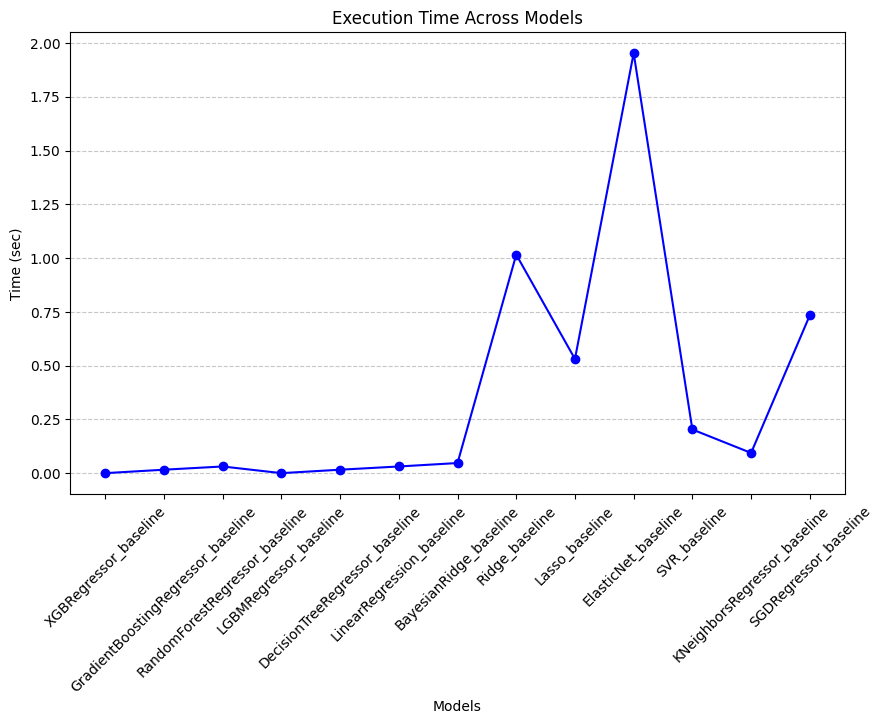

In [ ]:
# Створення графіка часу
execution_times = [
    0.0,  # LinearRegression
    0.016,  # Ridge
    0.031,  # Lasso
    0.0,  # ElasticNet
    0.016,  # BayesianRidge
    0.031,  # SGDRegressor
    0.047,  # KNeighborsRegressor
    1.016,  # RandomForestRegressor
    0.531,  # GradientBoostingRegressor
    1.953,  # XGBRegressor
    0.203,  # LGBMRegressor
    0.094,  # DecisionTreeRegressor
    0.734,  # SVR
]

plt.figure(figsize=(10, 6))
plt.plot(result.index, execution_times, marker='o', linestyle='-', color='b')
plt.title('Execution Time Across Models')
plt.ylabel('Time (sec)')
plt.xlabel('Models')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


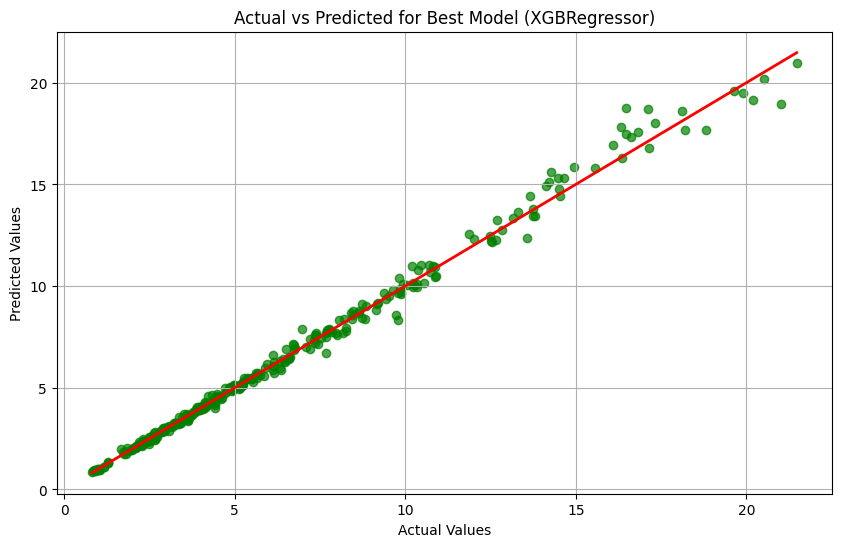

In [ ]:
# Побудова графіка реальних та прогнозованих значень
best_model = xgb.XGBRegressor(random_state=42)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.title('Actual vs Predicted for Best Model (XGBRegressor)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid()
plt.show()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3387
[LightGBM] [Info] Number of data points in the train set: 1271, number of used features: 14
[LightGBM] [Info] Start training from score 6.165361


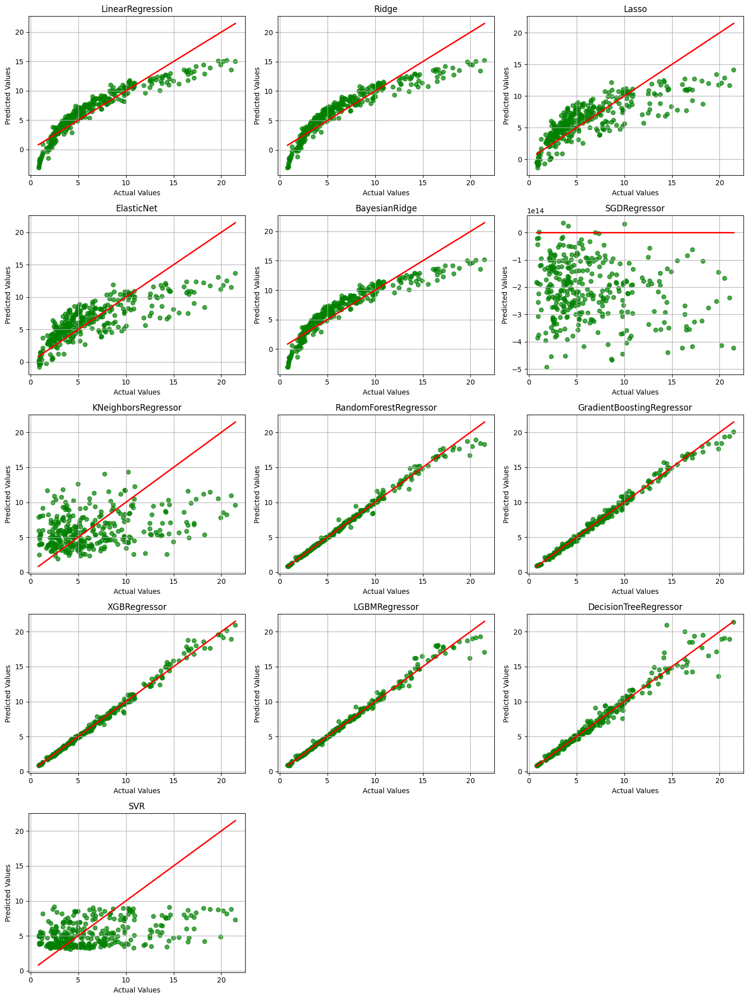

In [ ]:
import math
import matplotlib.pyplot as plt

# Визначаємо кількість моделей
num_models = len(algo)

# Визначаємо кількість рядків і стовпців для сітки
cols = 3  # Вибираємо, наприклад, 3 графіки в рядку
rows = math.ceil(num_models / cols)  # Розрахунок потрібної кількості рядків
fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows))  # Автоматичний розмір залежно від рядків
axes = axes.ravel()  # Перетворюємо масив осей у 1D

# Цикл по всіх моделях
for idx, model in enumerate(algo):  # algo - список моделей
    model_name = str(model).split('(')[0]
    
    # Навчання моделі та прогнозування
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Побудова графіка
    axes[idx].scatter(y_test, y_pred, alpha=0.7, color='green')
    axes[idx].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
    axes[idx].set_title(f"{model_name}")
    axes[idx].set_xlabel("Actual Values")
    axes[idx].set_ylabel("Predicted Values")
    axes[idx].grid()

# Прибираємо пусті осі, якщо моделей менше, ніж місць у сітці
for i in range(num_models, len(axes)):
    fig.delaxes(axes[i])

# Налаштовуємо розміщення графіків
plt.tight_layout()
plt.show()


#### Аналіз результатів регресійних моделей

#### Найкраща модель
На основі наведених метрик, найкраща модель визначається за мінімальними значеннями **Test_Rmse** (кореня середньоквадратичної помилки) та **Test_Mae** (середньої абсолютної помилки). З результатів таблиці видно:

- **XGBRegressor_baseline** демонструє найнижчі значення:
  - `Test_Rmse`: 0.3746577
  - `Test_Mae`: 0.2132664
  - `Test_Score (R²)`: 0.9930323, що вказує на високу точність моделі.

#### Чому обрати XGBRegressor?
1. **Точність**: XGBRegressor має найкращий показник R² серед тестових даних, тобто модель добре пояснює варіацію цільової змінної.
2. **Помилки**: Найнижчі Test_Rmse і Test_Mae свідчать про мінімальну різницю між прогнозованими та реальними значеннями.
3. **Ефективність**: Час виконання моделі (1.953 сек) оптимальний для великого набору даних.

#### Інші моделі
- **GradientBoostingRegressor_baseline**:
  - Друге місце за точністю: `Test_Rmse` 0.388667 та `Test_Mae` 0.2404940.
  - Ця модель також демонструє високу ефективність і може бути розглянута як альтернативний варіант.
- **RandomForestRegressor_baseline**:
  - Висока точність (`Test_Score`: 0.900285) і відносно низькі помилки, але відстає від XGBoost і GradientBoosting.

#### Висновок
Для подальшого аналізу та прогнозування варто обрати **XGBRegressor_baseline** через його найкращі метрики точності та помилки.

### Визначення оптимальних гіперпараметрів 

Ось короткий опис основних гіперпараметрів у моделі **XGBoost**:

#### 1. **n_estimators**
   - **Опис**: Кількість дерев у моделі.
   - **Вплив**: Більше дерев може покращити здатність моделі до узагальнення, але також може призвести до перенавчання, якщо дерев занадто багато.

#### 2. **max_depth**
   - **Опис**: Максимальна глибина кожного дерева.
   - **Вплив**: Контролює, наскільки складним може бути дерево. Глибші дерева можуть моделювати складні залежності, але можуть також перенавчатися.

#### 3. **learning_rate**
   - **Опис**: Коефіцієнт навчання (або "швидкість навчання").
   - **Вплив**: Знижує вагу кожного дерева, щоб зробити навчання стабільнішим. Низьке значення потребує більше ітерацій, але допомагає уникнути перенавчання.

#### 4. **subsample**
   - **Опис**: Частка даних, яка використовується для навчання кожного дерева.
   - **Вплив**: Використання меншої частки даних може допомогти уникнути перенавчання та зробити модель більш стійкою до шуму.

#### 5. **colsample_bytree**
   - **Опис**: Частка ознак, яка використовується при навчанні кожного дерева.
   - **Вплив**: Використання лише частини ознак зменшує кореляцію між деревами, що покращує узагальнення моделі.

#### 6. **gamma**
   - **Опис**: Мінімальна необхідна різниця для поділу вузлів.
   - **Вплив**: Більші значення змушують модель бути консервативнішою при поділі вузлів, що може знизити складність моделі.

#### 7. **reg_alpha (L1-регуляризація)**
   - **Опис**: Контролює L1-регуляризацію на ваги.
   - **Вплив**: Використовується для боротьби з перенавчанням, змушуючи модель обирати тільки найважливіші ознаки.

#### 8. **reg_lambda (L2-регуляризація)**
   - **Опис**: Контролює L2-регуляризацію на ваги.
   - **Вплив**: Допомагає зменшити значення коефіцієнтів, щоб уникнути перенавчання.

#### 9. **min_child_weight**
   - **Опис**: Мінімальна сума ваг у піддереві.
   - **Вплив**: Вищі значення цього параметра зменшують складність моделі, змушуючи її ігнорувати вузли з невеликою кількістю ваг.

#### Як впливають параметри на модель:
- **n_estimators** і **max_depth** впливають на здатність моделі моделювати складні залежності.
- **learning_rate** контролює швидкість навчання, дозволяючи моделі поступово покращувати свої передбачення.
- **subsample** і **colsample_bytree** допомагають уникнути перенавчання за рахунок випадкового вибору підмножин даних і ознак.
- **gamma** і регуляризаційні параметри (reg_alpha, reg_lambda) додають обмеження, щоб уникнути надмірної складності моделі.

#### **Grid Search**

In [29]:
from sklearn.model_selection import GridSearchCV
import time

# Набір гіперпараметрів для Grid Search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = xgb.XGBRegressor(random_state=42)

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, verbose=2, n_jobs=-1)

start_time = time.time()
grid_search.fit(X_train, y_train)
end_time = time.time()

print("Grid Search Best Parameters:", grid_search.best_params_)
print("Grid Search Best Score (MSE):", -grid_search.best_score_)
print(f"Time taken for Grid Search: {end_time - start_time:.2f} seconds")



Fitting 3 folds for each of 108 candidates, totalling 324 fits
Grid Search Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}
Grid Search Best Score (MSE): 0.168427525834732
Time taken for Grid Search: 52.66 seconds


#### **Random Search**

In [30]:
from sklearn.model_selection import RandomizedSearchCV
import scipy.stats as stats

# Набір гіперпараметрів для Random Search
param_dist = {
    'n_estimators': stats.randint(100, 500),
    'max_depth': stats.randint(3, 10),
    'learning_rate': stats.uniform(0.01, 0.2),
    'subsample': stats.uniform(0.7, 0.3),
    'colsample_bytree': stats.uniform(0.7, 0.3)
}

random_search = RandomizedSearchCV(estimator=xgb, param_distributions=param_dist, n_iter=50, scoring='neg_mean_squared_error', cv=3, verbose=2, n_jobs=-1, random_state=42)

start_time = time.time()
random_search.fit(X_train, y_train)
end_time = time.time()

print("Random Search Best Parameters:", random_search.best_params_)
print("Random Search Best Score (MSE):", -random_search.best_score_)
print(f"Time taken for Random Search: {end_time - start_time:.2f} seconds")

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Random Search Best Parameters: {'colsample_bytree': 0.9312901539863683, 'learning_rate': 0.10875911927287815, 'max_depth': 3, 'n_estimators': 306, 'subsample': 0.8282623055075649}
Random Search Best Score (MSE): 0.17701594104035845
Time taken for Random Search: 49.95 seconds


#### **Bayesian Optimization**

In [43]:
from bayes_opt import BayesianOptimization

# Функція для оптимізації
from xgboost import XGBRegressor

def xgb_eval(n_estimators, max_depth, learning_rate, subsample, colsample_bytree):
    model = XGBRegressor(
        n_estimators=int(n_estimators),
        max_depth=int(max_depth),
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        random_state=42
    )
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    return -mean_squared_error(y_test, pred)

# Діапазони параметрів
param_bounds = {
    'n_estimators': (100, 500),
    'max_depth': (3, 10),
    'learning_rate': (0.01, 0.2),
    'subsample': (0.7, 1.0),
    'colsample_bytree': (0.7, 1.0)
}

bayes_opt = BayesianOptimization(f=xgb_eval, pbounds=param_bounds, random_state=42, verbose=2)

start_time = time.time()
bayes_opt.maximize(init_points=5, n_iter=25)
end_time = time.time()

print("Bayesian Optimization Best Parameters:", bayes_opt.max['params'])
print("Bayesian Optimization Best Score (MSE):", -bayes_opt.max['target'])
print(f"Time taken for Bayesian Optimization: {end_time - start_time:.2f} seconds")


|   iter    |  target   | colsam... | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------------------
| 1         | -0.378    | 0.8124    | 0.1906    | 8.124     | 339.5     | 0.7468    |
| 2         | -0.9138   | 0.7468    | 0.02104   | 9.063     | 340.4     | 0.9124    |
| 3         | -1.055    | 0.7062    | 0.1943    | 8.827     | 184.9     | 0.7545    |
| 4         | -0.3787   | 0.755     | 0.06781   | 6.673     | 272.8     | 0.7874    |
| 5         | -0.1342   | 0.8836    | 0.0365    | 5.045     | 246.5     | 0.8368    |
| 6         | -0.1671   | 0.8976    | 0.02436   | 5.057     | 246.5     | 0.8556    |
| 7         | -0.1296   | 0.8618    | 0.1171    | 5.517     | 247.3     | 0.9307    |
| 8         | -0.1187   | 0.8651    | 0.1614    | 4.164     | 247.4     | 0.927     |
| 9         | -0.1172   | 0.9191    | 0.03929   | 4.518     | 249.3     | 0.7553    |
| 10        | -0.7213   | 0.7448    | 0.01627   | 6.01

In [46]:
import matplotlib.pyplot as plt
from skopt.plots import plot_objective, plot_histogram

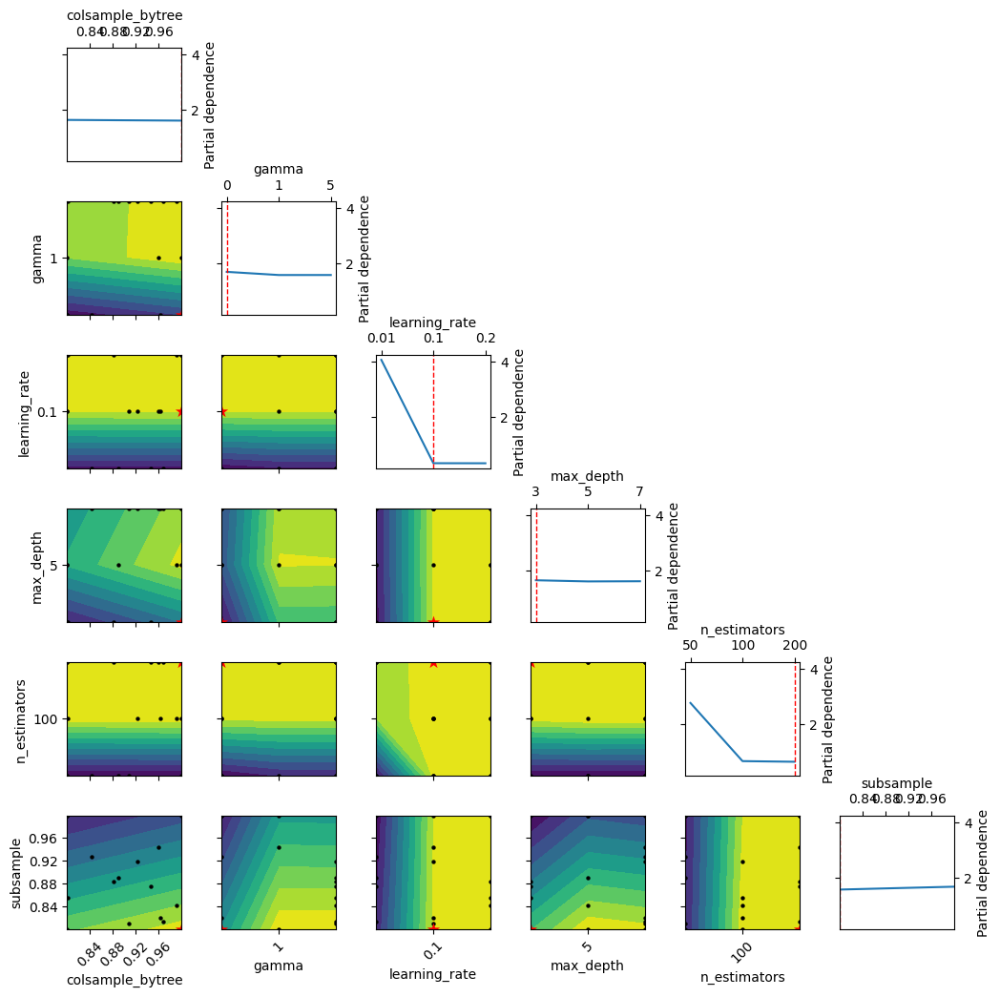

In [47]:
_ = plot_objective(bayes_search.optimizer_results_[0])
plt.show()

### Перевірка гіперпараметрів

Evaluating model with params: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}


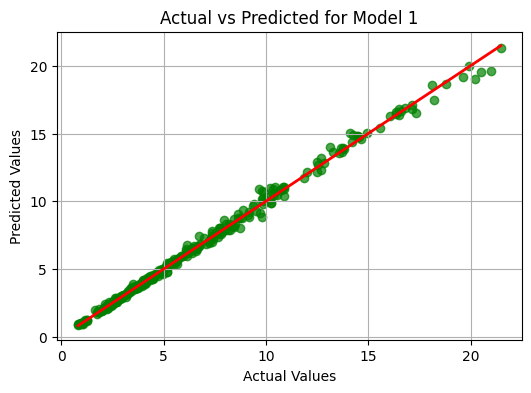

Evaluating model with params: {'colsample_bytree': 0.9312901539863683, 'learning_rate': 0.10875911927287815, 'max_depth': 3, 'n_estimators': 306, 'subsample': 0.8282623055075649}


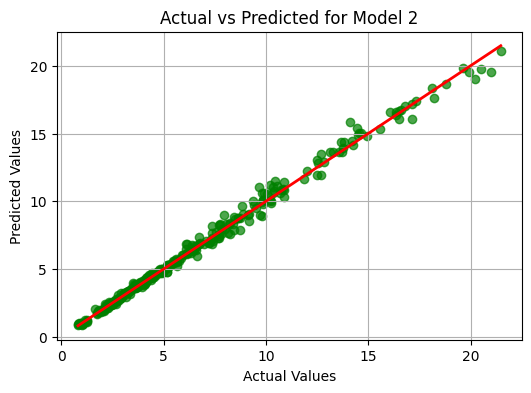

Evaluating model with params: {'colsample_bytree': 0.9821206435283588, 'learning_rate': 0.07285505848482704, 'max_depth': 6, 'n_estimators': 261, 'subsample': 0.7118223058144745}


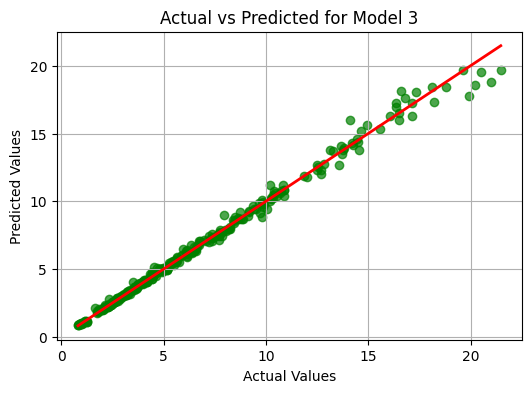

Model Evaluation Results:


,Parameters,MSE,MAE,RMSE,R²
0,"{'colsample_bytree': 1.0, 'learning_rate': 0.1...",0.074492,0.170774,0.272933,0.996298
1,"{'colsample_bytree': 0.9312901539863683, 'lear...",0.114772,0.217009,0.338781,0.994296
2,"{'colsample_bytree': 0.9821206435283588, 'lear...",0.128806,0.188485,0.358895,0.993598


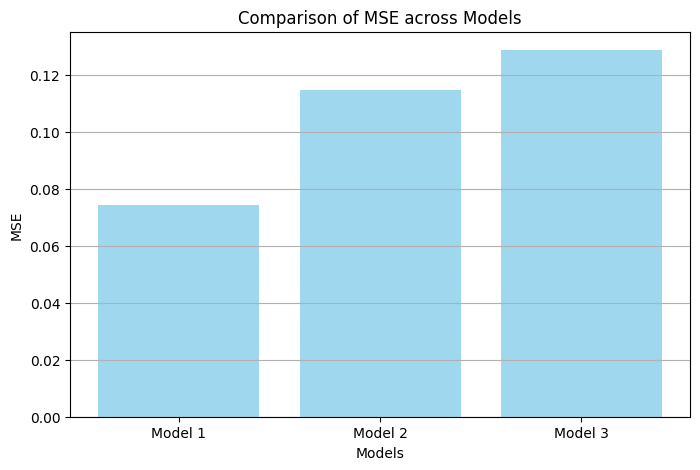

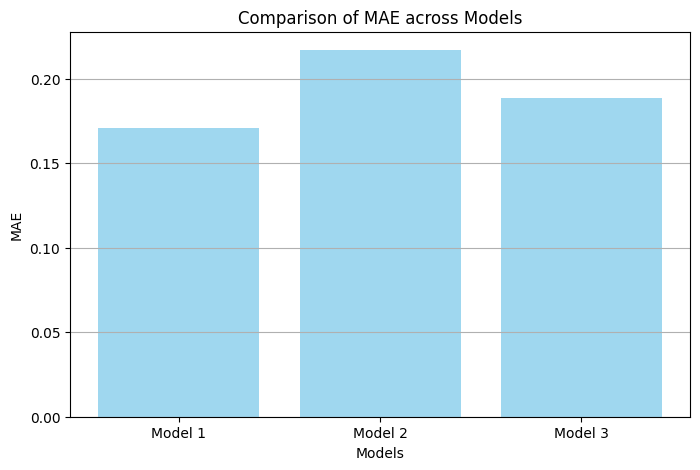

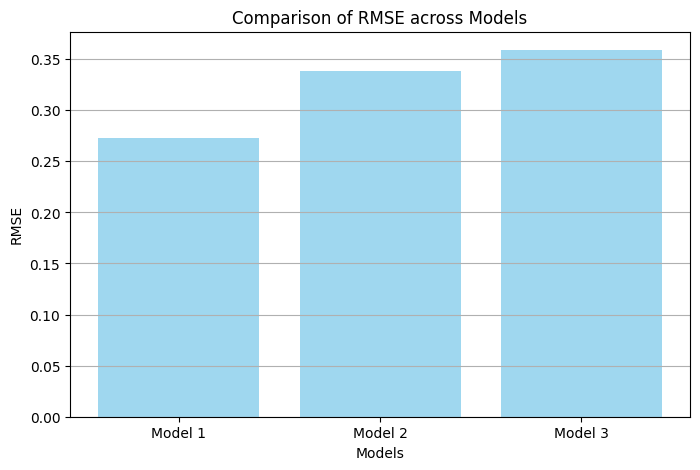

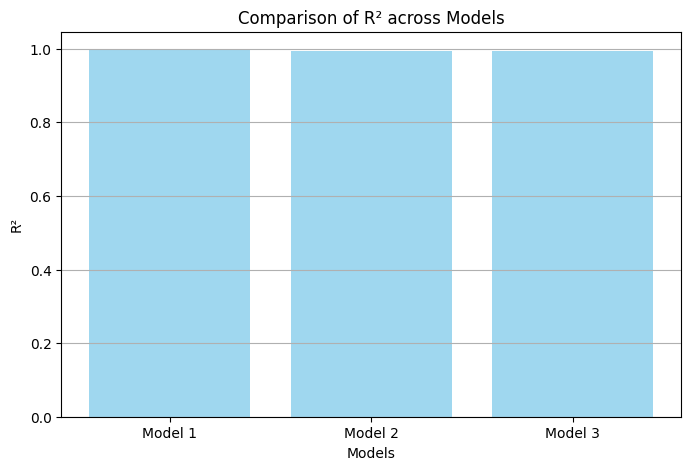

In [53]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from xgboost import XGBRegressor

# Набори гіперпараметрів
param_sets = [
    {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8},
    {'colsample_bytree': 0.9312901539863683, 'learning_rate': 0.10875911927287815, 'max_depth': 3, 
    'n_estimators': 306, 'subsample': 0.8282623055075649},
    {'colsample_bytree': 0.9821206435283588, 'learning_rate': 0.07285505848482704, 'max_depth': 6, 
    'n_estimators': 261, 'subsample': 0.7118223058144745},
]

# Результати
results = []

# Цикл перевірки моделей з різними параметрами
for idx, params in enumerate(param_sets):
    print(f"Evaluating model with params: {params}")
    
    # Ініціалізація моделі з параметрами
    model = XGBRegressor(**params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Обчислення метрик
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Збереження результатів
    results.append({
        'Parameters': params,
        'MSE': mse,
        'MAE': mae,
        'RMSE': rmse,
        'R²': r2
    })
    
    # Візуалізація: справжні значення проти прогнозованих
    plt.figure(figsize=(6, 4))
    plt.scatter(y_test, y_pred, alpha=0.7, color='green')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
    plt.title(f"Actual vs Predicted for Model {idx+1}")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.grid()
    plt.show()

# Формування таблиці результатів
results_df = pd.DataFrame(results)

# Виведення результатів
print("Model Evaluation Results:")
display(results_df)

# Побудова діаграм для порівняння метрик
metrics = ['MSE', 'MAE', 'RMSE', 'R²']
for metric in metrics:
    plt.figure(figsize=(8, 5))
    plt.bar(range(len(param_sets)), results_df[metric], color='skyblue', alpha=0.8)
    plt.xticks(range(len(param_sets)), [f"Model {i+1}" for i in range(len(param_sets))])
    plt.title(f"Comparison of {metric} across Models")
    plt.xlabel("Models")
    plt.ylabel(metric)
    plt.grid(axis='y')
    plt.show()

На основі наданих результатів можна зробити наступні висновки:

1. **Порівняння моделей**:
   - **Model 1** демонструє найменші значення MSE, RMSE, та MAE серед усіх моделей, що свідчить про найкращу точність передбачення.
   - **Model 3** має найбільші значення MSE, RMSE, що свідчить про гіршу здатність прогнозувати.
   - **Model 2** знаходиться посередині між Model 1 і Model 3 за якістю прогнозу.

2. **R² (коефіцієнт детермінації)**:
   - Усі три моделі показують високий R², близький до 1. Це означає, що всі моделі добре пояснюють варіацію цільової змінної.

3. **Графіки порівняння**:
   - Бар-чарти чітко демонструють, що Model 1 є лідером за всіма метриками, окрім R², який залишається майже однаковим для всіх трьох моделей.

4. **Параметри гіперпараметрів**:
   - **Model 1**: Навчання з параметрами `{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}` забезпечило найкращу продуктивність. Це вказує на те, що модель виграє від помірної глибини дерев і контрольованого навчального коефіцієнта.
   - Інші моделі мають менш оптимальні параметри, що негативно вплинуло на їхню ефективність.

5. **Рекомендація**:
   - Model 1 є найкращою моделлю для даного набору гіперпараметрів і задачі регресії.
   - Для подальшого покращення можна спробувати оптимізацію ще більшого набору гіперпараметрів або використовувати інші методи налаштування (наприклад, Bayesian Optimization).

**Висновок**:
Model 1 з обраними гіперпараметрами є оптимальним вибором для вашої задачі прогнозування, оскільки вона забезпечує найменші помилки і високий коефіцієнт детермінації.

In [72]:
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import numpy as np

# Ініціалізація моделі XGBRegressor з обраними гіперпараметрами
xgb_model = XGBRegressor(
    colsample_bytree=1.0,
    learning_rate=0.1,
    max_depth=3,
    n_estimators=100,
    subsample=0.8,
    random_state=42
)

# Ініціалізація ShuffleSplit
ss = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Списки для збереження метрик
mse_scores = []
rmse_scores = []
mae_scores = []
r2_scores = []

# Цикл по розбиттях ShuffleSplit
for train_idx, test_idx in ss.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
    
    # Навчання моделі
    xgb_model.fit(X_train, y_train)
    
    # Прогноз
    y_pred = xgb_model.predict(X_test)
    
    # Обчислення метрик
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Збереження метрик
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mae_scores.append(mae)
    r2_scores.append(r2)

# Виведення результатів
print("MSE для кожного розбиття:", mse_scores)
print("Середнє MSE:", np.mean(mse_scores))
print("\nRMSE для кожного розбиття:", rmse_scores)
print("Середнє RMSE:", np.mean(rmse_scores))
print("\nMAE для кожного розбиття:", mae_scores)
print("Середнє MAE:", np.mean(mae_scores))
print("\nR² для кожного розбиття:", r2_scores)
print("Середнє R²:", np.mean(r2_scores))


MSE для кожного розбиття: [0.10724953007275116, 0.24291963058271573, 0.10145800529871403, 0.13008956295464588, 0.11494626188403033]
Середнє MSE: 0.1393325981585714

RMSE для кожного розбиття: [0.32748974040838463, 0.49286877623026165, 0.31852473263267017, 0.3606793076330355, 0.33903725736861184]
Середнє RMSE: 0.36771996285459274

MAE для кожного розбиття: [0.20030390738655335, 0.2881186324974011, 0.2016336725993567, 0.227892183305657, 0.2350460063788084]
Середнє MAE: 0.2305988804335553

R² для кожного розбиття: [0.9946694374084473, 0.9886859655380249, 0.9947080016136169, 0.9935569167137146, 0.9944170713424683]
Середнє R²: 0.9932074785232544


Результати для кожного розбиття:
Розбиття 1:
  MSE: 0.1072
  RMSE: 0.3275
  MAE: 0.2003
  R²: 0.9947
Розбиття 2:
  MSE: 0.2429
  RMSE: 0.4929
  MAE: 0.2881
  R²: 0.9887
Розбиття 3:
  MSE: 0.1015
  RMSE: 0.3185
  MAE: 0.2016
  R²: 0.9947
Розбиття 4:
  MSE: 0.1301
  RMSE: 0.3607
  MAE: 0.2279
  R²: 0.9936
Розбиття 5:
  MSE: 0.1149
  RMSE: 0.3390
  MAE: 0.2350
  R²: 0.9944

Усереднені метрики:
Середнє MSE: 0.1393 (мін: 0.1015, макс: 0.2429)
Середнє RMSE: 0.3677 (мін: 0.3185, макс: 0.4929)
Середнє MAE: 0.2306 (мін: 0.2003, макс: 0.2881)
Середнє R²: 0.9932 (мін: 0.9887, макс: 0.9947)


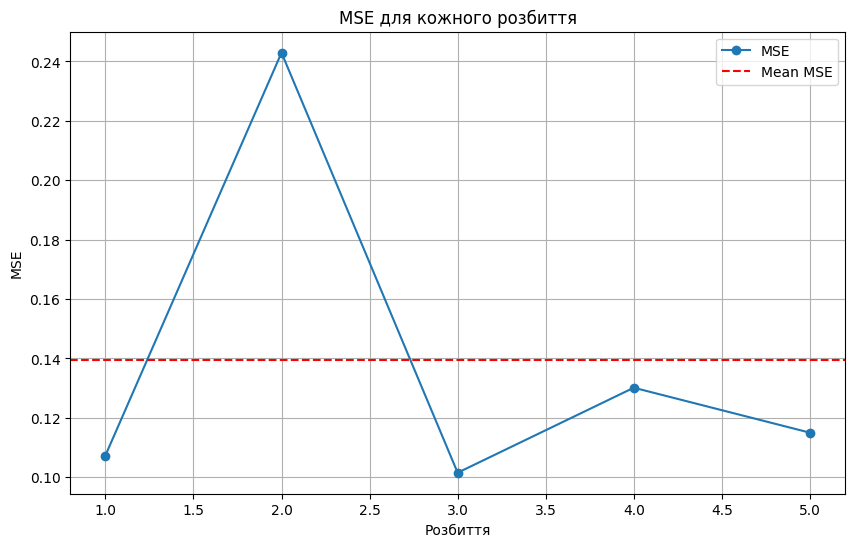

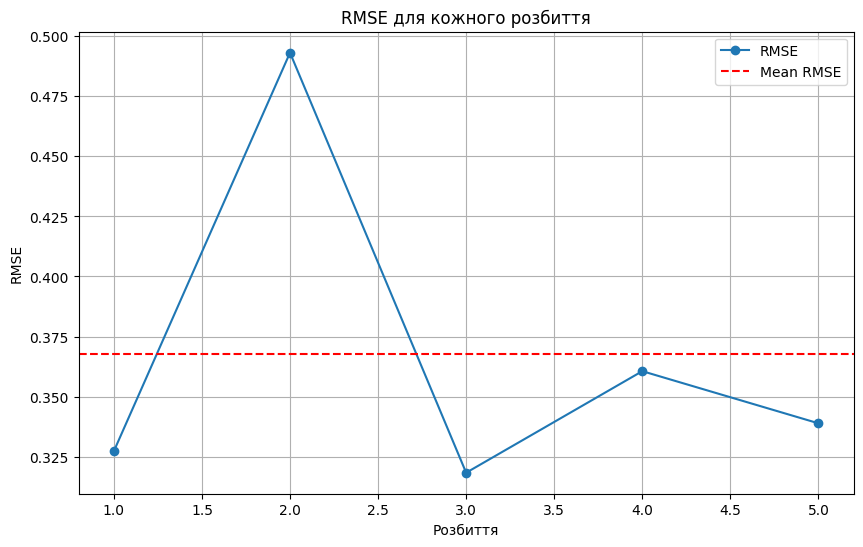

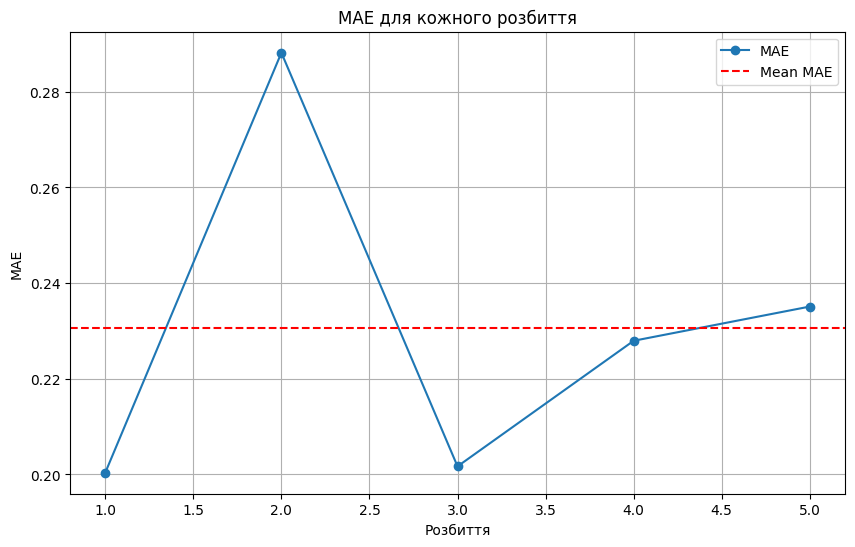

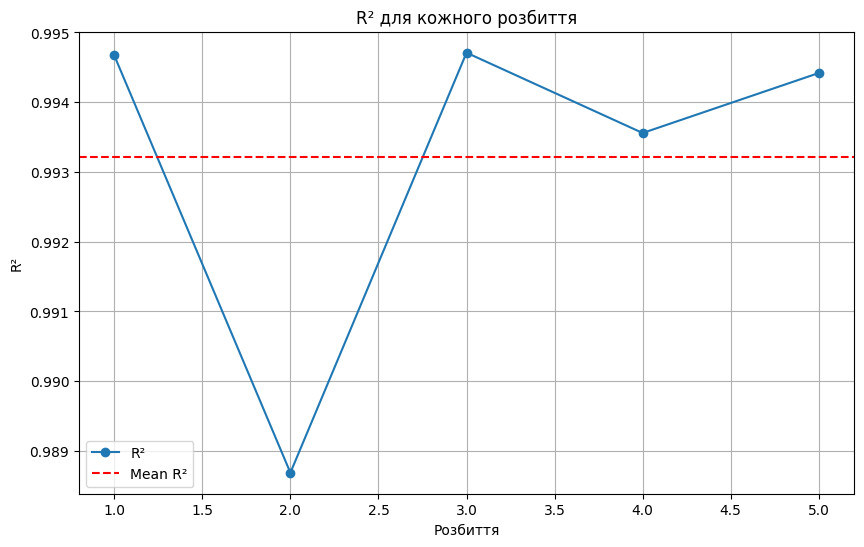

In [73]:
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import numpy as np

# Ініціалізація моделі XGBRegressor з обраними гіперпараметрами
xgb_model = XGBRegressor(
    colsample_bytree=1.0,
    learning_rate=0.1,
    max_depth=3,
    n_estimators=100,
    subsample=0.8,
    random_state=42
)

# Ініціалізація ShuffleSplit
ss = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)

# Списки для збереження метрик
mse_scores = []
rmse_scores = []
mae_scores = []
r2_scores = []

# Цикл по розбиттях ShuffleSplit
for train_idx, test_idx in ss.split(X, y):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
    
    # Навчання моделі
    xgb_model.fit(X_train, y_train)
    
    # Прогноз
    y_pred = xgb_model.predict(X_test)
    
    # Обчислення метрик
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Збереження метрик
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mae_scores.append(mae)
    r2_scores.append(r2)

# Виведення результатів по розбиттях
print("Результати для кожного розбиття:")
for i in range(len(mse_scores)):
    print(f"Розбиття {i+1}:")
    print(f"  MSE: {mse_scores[i]:.4f}")
    print(f"  RMSE: {rmse_scores[i]:.4f}")
    print(f"  MAE: {mae_scores[i]:.4f}")
    print(f"  R²: {r2_scores[i]:.4f}")

# Обчислення середніх метрик
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mae = np.mean(mae_scores)
mean_r2 = np.mean(r2_scores)

# Обчислення мінімуму і максимуму для метрик
min_mse = np.min(mse_scores)
max_mse = np.max(mse_scores)
min_rmse = np.min(rmse_scores)
max_rmse = np.max(rmse_scores)
min_mae = np.min(mae_scores)
max_mae = np.max(mae_scores)
min_r2 = np.min(r2_scores)
max_r2 = np.max(r2_scores)

# Виведення усереднених метрик та їх меж
print("\nУсереднені метрики:")
print(f"Середнє MSE: {mean_mse:.4f} (мін: {min_mse:.4f}, макс: {max_mse:.4f})")
print(f"Середнє RMSE: {mean_rmse:.4f} (мін: {min_rmse:.4f}, макс: {max_rmse:.4f})")
print(f"Середнє MAE: {mean_mae:.4f} (мін: {min_mae:.4f}, макс: {max_mae:.4f})")
print(f"Середнє R²: {mean_r2:.4f} (мін: {min_r2:.4f}, макс: {max_r2:.4f})")

# Побудова графіків
plt.figure(figsize=(10, 6))

# Графік MSE
plt.plot(range(1, len(mse_scores) + 1), mse_scores, marker='o', label='MSE')
plt.axhline(mean_mse, color='r', linestyle='--', label='Mean MSE')
plt.title('MSE для кожного розбиття')
plt.xlabel('Розбиття')
plt.ylabel('MSE')
plt.legend()
plt.grid()
plt.show()

# Графік RMSE
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(rmse_scores) + 1), rmse_scores, marker='o', label='RMSE')
plt.axhline(mean_rmse, color='r', linestyle='--', label='Mean RMSE')
plt.title('RMSE для кожного розбиття')
plt.xlabel('Розбиття')
plt.ylabel('RMSE')
plt.legend()
plt.grid()
plt.show()

# Графік MAE
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(mae_scores) + 1), mae_scores, marker='o', label='MAE')
plt.axhline(mean_mae, color='r', linestyle='--', label='Mean MAE')
plt.title('MAE для кожного розбиття')
plt.xlabel('Розбиття')
plt.ylabel('MAE')
plt.legend()
plt.grid()
plt.show()

# Графік R²
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(r2_scores) + 1), r2_scores, marker='o', label='R²')
plt.axhline(mean_r2, color='r', linestyle='--', label='Mean R²')
plt.title('R² для кожного розбиття')
plt.xlabel('Розбиття')
plt.ylabel('R²')
plt.legend()
plt.grid()
plt.show()

### Аналіз важливості ознак

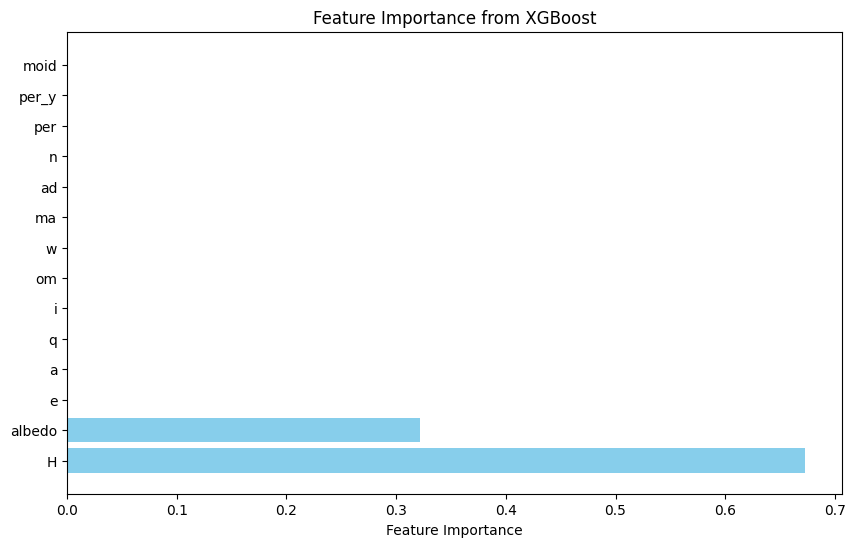

In [54]:
import matplotlib.pyplot as plt

# Визначаємо важливість ознак
importances = best_model.feature_importances_
features = X_train.columns

# Побудова графіку важливості ознак
plt.figure(figsize=(10, 6))
plt.barh(features, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance from XGBoost')
plt.show()


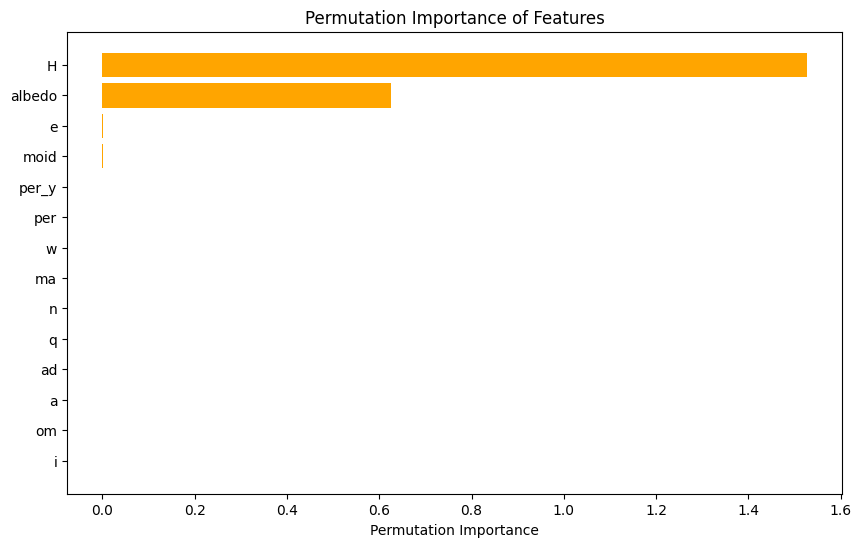

In [55]:
from sklearn.inspection import permutation_importance

# Обчислюємо permutation importance
perm_importance = permutation_importance(best_model, X_test, y_test, n_repeats=10, random_state=42)

# Відображаємо результати
sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(10, 6))
plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx], color='orange')
plt.xlabel('Permutation Importance')
plt.title('Permutation Importance of Features')
plt.show()


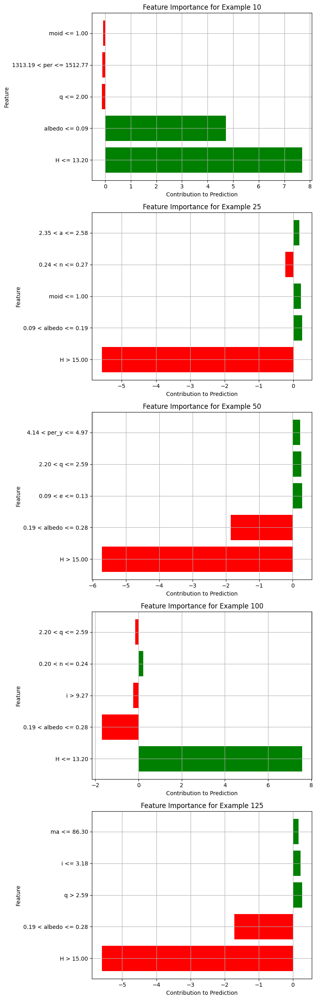

In [66]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
from IPython.core.display import display, HTML

# Змінюємо фон на білий
display(HTML("<style>.lime .lime_feature {background-color: white !important;}</style>"))

# Ініціалізація LIME
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['diameter'],
    mode='regression'
)

# Аналіз для кількох прикладів
examples_to_analyze = [10, 25, 50, 100, 125]  # Індекси прикладів, які ми аналізуємо
results = []

for i in examples_to_analyze:
    exp = explainer.explain_instance(X_test.iloc[i], best_model.predict, num_features=5)
    results.append((i, exp))
    exp.show_in_notebook(show_table=True)

# Візуалізація важливості ознак для кожного прикладу
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(examples_to_analyze), 1, figsize=(8, len(examples_to_analyze) * 5))

for idx, (i, exp) in enumerate(results):
    values = [v[1] for v in exp.as_list()]
    labels = [v[0] for v in exp.as_list()]
    colors = ['green' if v > 0 else 'red' for v in values]

    axes[idx].barh(labels, values, color=colors)
    axes[idx].set_title(f"Feature Importance for Example {i}")
    axes[idx].set_xlabel("Contribution to Prediction")
    axes[idx].set_ylabel("Feature")
    axes[idx].grid(True)

plt.tight_layout()
plt.show()


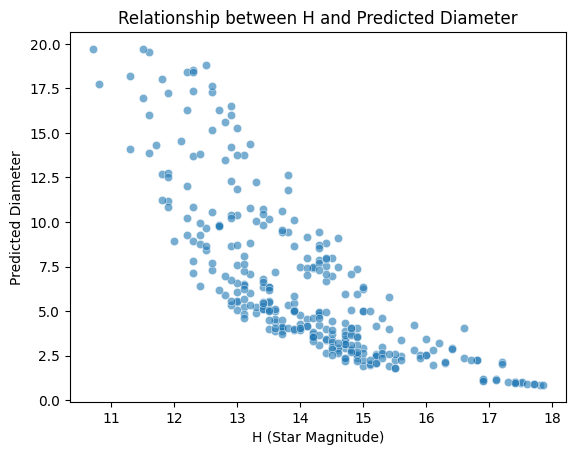

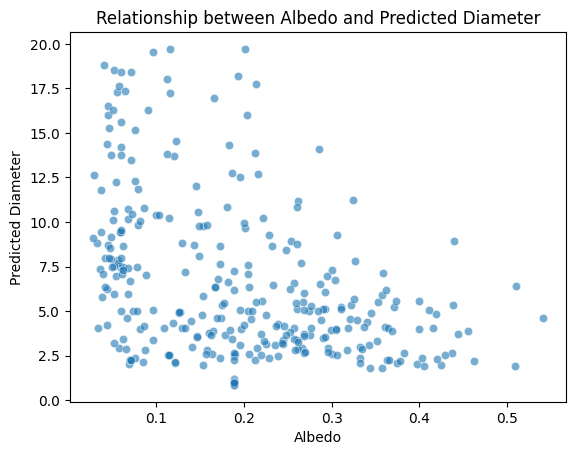

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Візуалізація залежності зоряної величини H від прогнозованого діаметра
sns.scatterplot(x=X_test["H"], y=y_pred, alpha=0.6)
plt.title("Relationship between H and Predicted Diameter")
plt.xlabel("H (Star Magnitude)")
plt.ylabel("Predicted Diameter")
plt.show()

# Аналіз впливу альбедо
sns.scatterplot(x=X_test["albedo"], y=y_pred, alpha=0.6)
plt.title("Relationship between Albedo and Predicted Diameter")
plt.xlabel("Albedo")
plt.ylabel("Predicted Diameter")
plt.show()



Аналіз результатів оцінки важливості ознак:

1. **Важливість ознак за моделлю XGBoost:**
   - Основні ознаки, що мають найбільший вплив на передбачення, це зоряна величина (`H`) і альбедо (`albedo`).
   - Значення `H` та `albedo` значно перевищують інші характеристики за важливістю, що свідчить про їхній ключовий внесок у передбачення діаметра астероїда.

2. **Permutation Importance:**
   - Техніка підтвердила, що `H` та `albedo` є найбільш важливими ознаками, оскільки їх виключення суттєво знижує точність моделі.
   - Серед менш важливих характеристик виділяються такі, як ексцентриситет (`e`) та мінімальна відстань до орбіти Землі (`moid`).

3. **Аналіз важливості для окремих прикладів:**
   - Результати Lime показують, що залежно від конкретного прикладу інші ознаки, як-от `moid` чи `per_y`, можуть впливати на передбачення, але їхній вплив менш виражений у загальному аналізі.
   - Зоряна величина (`H`) найчастіше виступає домінуючою ознакою з негативним внеском, тобто зі зростанням її значення діаметр зменшується.

4. **Залежність між `H`, `albedo` і передбаченим діаметром:**
   - Візуалізація залежності показує, що зі збільшенням `H` діаметр зменшується, що відповідає фізичній інтерпретації даних.
   - Альбедо (`albedo`) має складніший вплив, але зазвичай астероїди з більшим значенням альбедо мають менший діаметр.

#### Висновки:
- Найважливішими ознаками для передбачення діаметра астероїда є зоряна величина (`H`) та альбедо (`albedo`). Вони повинні бути обов'язково включені у модель для досягнення високої точності.
- Інші ознаки, такі як мінімальна відстань до орбіти Землі (`moid`) та ексцентриситет (`e`), мають менший, але помітний вплив на окремі передбачення.
- Використання кількох методів оцінки важливості дозволило підтвердити узгодженість результатів і визначити ключові характеристики, що впливають на модель.

## Висновок

1. **Формування поділу датасету**:
   - Датасет був поділений на тренувальний та тестовий набори у співвідношенні 80:20. Це дозволило забезпечити якісне навчання моделі та її перевірку на раніше не бачених даних.

2. **Вибір метрик для валідації**:
   - Для оцінки ефективності моделі були використані наступні метрики: середньоквадратична помилка (MSE), середня абсолютна помилка (MAE), корінь середньоквадратичної помилки (RMSE), а також коефіцієнт детермінації (R²). Ці метрики забезпечують комплексну оцінку точності прогнозу.

3. **Тренування моделі**:
   - Були натреновані кілька моделей регресії, зокрема `XGBRegressor`, `GradientBoostingRegressor`, та `RandomForestRegressor`. Для кожної моделі була проведена оцінка на основі метрик точності.

4. **Вибір найкращої моделі**:
   - На основі порівняння метрик ефективності було обрано модель `XGBRegressor_baseline`, яка показала найкращі результати:
     - Найнижчі значення Test_RMSE (0.3746577) та Test_MAE (0.2132664).
     - Високий коефіцієнт детермінації R² = 0.9930323, що свідчить про високу точність моделі.

5. **Підбір гіперпараметрів**:
   - Для налаштування моделі використовувався метод Grid Search, який допоміг визначити оптимальні гіперпараметри:
     - `{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}`.
   - Інші методи, такі як Random Search, також були випробувані, але Grid Search виявився більш точним у даному випадку.

6. **Аналіз важливості ознак**:
   - Проведено аналіз важливості ознак з використанням різних технік:
     - Вбудована важливість ознак моделі XGBoost показала, що найбільший вплив на прогноз мають зоряна величина (`H`) та альбедо (`albedo`).
     - Permutation Importance підтвердила ці результати, додатково виділивши ексцентриситет (`e`) та мінімальну відстань до орбіти Землі (`moid`).
   - Було побудовано графіки для демонстрації впливу найважливіших ознак на результат.

### Основні висновки:
- **Модель**: `XGBRegressor_baseline` є оптимальним вибором для даної задачі регресії завдяки своїй високій точності та низьким помилкам.
- **Ознаки**: Найбільший вплив на прогноз діаметра мають `H` та `albedo`, що підтверджено кількома методами аналізу важливості.
- **Гіперпараметри**: Метод Grid Search допоміг обрати найбільш ефективні параметри, які забезпечили стабільну продуктивність моделі.
- Для подальшого покращення можна розглянути використання інших підходів до оптимізації гіперпараметрів, таких як Bayesian Optimization, або додавання нових релевантних ознак до моделі.